In [ ]:
install.packages("GGally")
install.packages("car")

library(ggplot2)
library(GGally)
library(car)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘Rcpp’, ‘plyr’, ‘reshape’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘numDeriv’, ‘SparseM’, ‘MatrixModels’, ‘minqa’, ‘nloptr’, ‘RcppEigen’, ‘carData’, ‘abind’, ‘pbkrtest’, ‘quantreg’, ‘lme4’


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: carData



In [ ]:
library("readxl")
install.packages("caret")
install.packages("leaps")

options(repr.plot.width=5, repr.plot.height=5)

data<- read_excel("copd_data.xlsx", na = 'unknown')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘listenv’, ‘parallelly’, ‘future’, ‘globals’, ‘future.apply’, ‘progressr’, ‘SQUAREM’, ‘lava’, ‘prodlim’, ‘proxy’, ‘iterators’, ‘clock’, ‘gower’, ‘hardhat’, ‘ipred’, ‘timeDate’, ‘e1071’, ‘foreach’, ‘ModelMetrics’, ‘pROC’, ‘recipes’, ‘reshape2’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
head(data)
summary(data)


sid,visit_year,visit_date,visit_age,gender,race,height_cm,weight_kg,sysBP,diasBP,⋯,total_lung_capacity,pct_emphysema,functional_residual_capacity,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2
<chr>,<dbl>,<dttm>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10005Q,2008,2008-01-15,54.5,Female,White,159.9,73.0,130,80,⋯,5.6636,0.926851,2.4766,6.80077,-830.343,-650.526,0.77,2.921,3.805,2.622
10006S,2008,2008-01-15,62.3,Female,White,162.6,86.0,170,80,⋯,5.2325,14.005900,-1.0000,-1.00000,-841.880,-1.000,0.43,1.288,3.022,1.318
10010J,2008,2008-01-15,65.9,Female,White,162.1,62.8,96,63,⋯,5.1960,1.683760,3.8993,41.34930,-833.429,-789.595,0.53,1.008,1.909,1.087
10015T,2008,2008-02-15,59.6,Male,White,182.9,110.0,142,88,⋯,6.3971,9.330450,-1.0000,-1.00000,-841.315,-1.000,0.51,1.906,3.732,2.002
10017X,2008,2008-06-15,67.5,Male,White,179.1,83.0,106,72,⋯,7.8935,36.262400,4.1043,46.17690,-887.947,-792.397,0.57,2.748,4.827,2.178
10022Q,2008,2008-02-15,69.8,Female,White,158.8,78.0,122,78,⋯,5.1016,30.484400,-1.0000,-1.00000,-865.608,-1.000,0.53,1.076,2.047,0.924


     sid              visit_year     visit_date                    
 Length:5747        Min.   :2008   Min.   :2008-01-15 00:00:00.00  
 Class :character   1st Qu.:2009   1st Qu.:2009-02-15 00:00:00.00  
 Mode  :character   Median :2009   Median :2009-09-15 00:00:00.00  
                    Mean   :2009   Mean   :2009-09-09 13:46:06.86  
                    3rd Qu.:2010   3rd Qu.:2010-04-15 00:00:00.00  
                    Max.   :2011   Max.   :2011-04-15 00:00:00.00  
   visit_age        gender              race             height_cm    
 Min.   :39.00   Length:5747        Length:5747        Min.   :133.7  
 1st Qu.:52.60   Class :character   Class :character   1st Qu.:162.6  
 Median :59.50   Mode  :character   Mode  :character   Median :170.0  
 Mean   :59.75                                         Mean   :169.9  
 3rd Qu.:66.30                                         3rd Qu.:177.0  
 Max.   :85.00                                         Max.   :208.3  
   weight_kg          sysBP

In [ ]:
nrow(data)

data[data == -1] <- NA


nrow(na.omit(data))

data = na.omit(data)





[1] 5747

[1] 2747

In [ ]:
head(data)
summary(data)

In [ ]:
model <- lm(FEV1 ~ sysBP + diasBP , data = data)
summary(model)$coef
summary(model)

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),2.08932333,0.137931730,15.147518,7.710178e-50
sysBP,-0.00794345,0.001127868,-7.042892,2.370708e-12
diasBP,0.01735853,0.001775553,9.776410,3.261874e-22



Call:
lm(formula = FEV1 ~ sysBP + diasBP, data = data)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.26266 -0.57175 -0.02898  0.56924  2.94468 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.089323   0.137932  15.148  < 2e-16 ***
sysBP       -0.007943   0.001128  -7.043 2.37e-12 ***
diasBP       0.017359   0.001776   9.776  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.8367 on 2744 degrees of freedom
Multiple R-squared:  0.03533,	Adjusted R-squared:  0.03463 
F-statistic: 50.25 on 2 and 2744 DF,  p-value: < 2.2e-16


In [ ]:
unique(data$copd)

[1] "No"  "Yes"

In [ ]:
class(data$smoking_status)

#data$smoking_status = as.integer(data$smoking_status)

class(data$smoking_status)

data$smoking_status <- factor(data$smoking_status)
class(data$smoking_status)

[1] "character"

[1] "character"

[1] "factor"

In [ ]:
head(data$smoking_status)


[1] Current smoker Former smoker  Former smoker  Current smoker Former smoker 
[6] Former smoker 
Levels: Current smoker Former smoker

In [ ]:
data$pulse_pressure = data$sysBP - data$diasBP
head(data)

sid,visit_year,visit_date,visit_age,gender,race,height_cm,weight_kg,sysBP,diasBP,⋯,pct_emphysema,functional_residual_capacity,pct_gastrapping,insp_meanatt,exp_meanatt,FEV1_FVC_ratio,FEV1,FVC,FEV1_phase2,pulse_pressure
<chr>,<dbl>,<dttm>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10005Q,2008,2008-01-15,54.5,Female,White,159.9,73.0,130,80,⋯,0.926851,2.4766,6.80077,-830.343,-650.526,0.77,2.921,3.805,2.622,50
10055F,2008,2008-03-15,69.0,Male,Black or African American,178.0,90.7,168,100,⋯,1.945200,1.9057,10.68350,-823.746,-638.442,0.73,2.917,3.999,2.439,68
10056H,2008,2008-02-15,48.7,Female,White,153.7,86.2,100,53,⋯,11.383200,4.0606,47.88110,-836.281,-797.471,0.29,0.374,1.281,0.379,47
10057J,2008,2008-04-15,56.8,Male,White,170.0,79.7,131,68,⋯,7.525360,4.0210,27.83840,-856.567,-756.317,0.51,2.266,4.425,1.464,63
10060Y,2008,2008-05-15,72.8,Male,White,177.0,89.6,147,71,⋯,19.262300,5.3342,53.47470,-867.254,-821.256,0.29,0.706,2.424,1.405,76
10068O,2008,2008-03-15,76.2,Female,White,155.0,55.0,134,78,⋯,41.775700,4.1552,66.16210,-903.436,-856.337,0.46,0.806,1.736,0.580,56


Warning message in warn_if_args_exist(list(...)):
“Extra arguments: 'binwidth' are being ignored.  If these are meant to be aesthetics, submit them using the 'mapping' variable within ggpairs with ggplot2::aes or ggplot2::aes_string.”


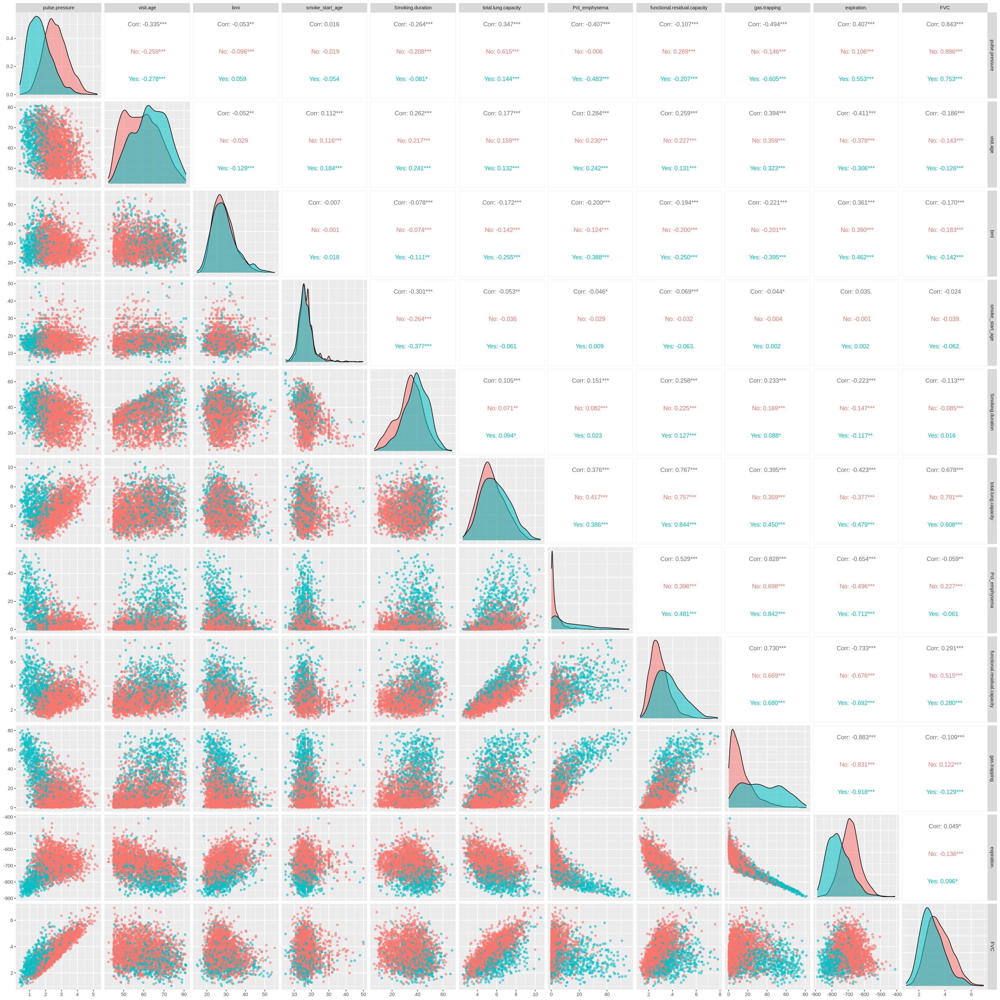

In [ ]:
options(repr.plot.width=25, repr.plot.height=25)
plot_frame <- data.frame("pulse pressure" = data$FEV1,
                         "visit age" = data$visit_age,
                         "bmi" = data$bmi,
                         "smoke_start_age" = data$SmokStartAge,
                         "Smoking duration" = data$Duration_Smoking,
                         "total lung capacity" = data$total_lung_capacity,
                         "Pct_emphysema" = data$pct_emphysema,
                         "functional residual capacity" = data$functional_residual_capacity,
                         "gas trapping" = data$pct_gastrapping,
                           "expiration " = data$exp_meanatt,
                             "FVC" = data$FVC
                        )
ggpairs(plot_frame, aes(color=data$copd, alpha=0.5), binwidth=30)

In [ ]:
library(MASS)

[1] 0.7878788


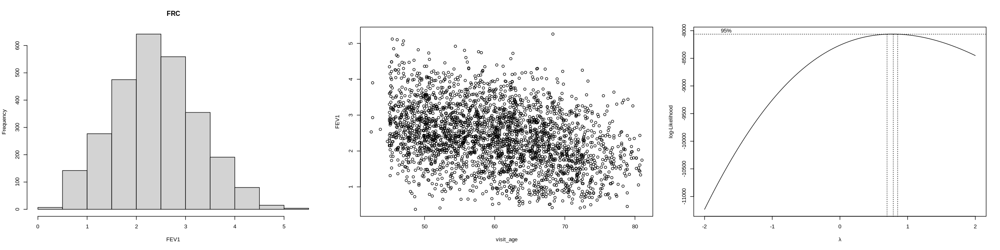

In [ ]:
options(repr.plot.width=20, repr.plot.height = 5)
par(mfrow = c(1,3))
with(data, hist(FEV1, main = "FRC"))
plot(FEV1 ~ visit_age, data)
bc = boxcox(lm(data$FEV1 ~ data$visit_age))
pow <- bc$x[which.max(bc$y)]
print(pow)

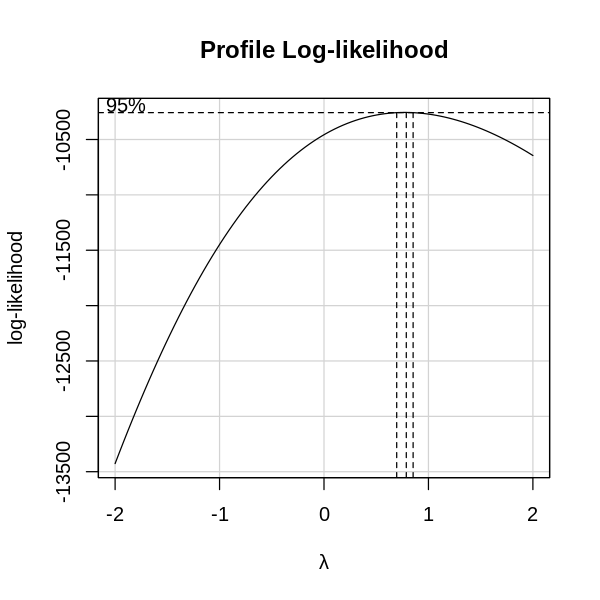

In [ ]:
options(repr.plot.width=5, repr.plot.height=5)
boxCox(lm(FEV1~visit_age, data=data))

In [ ]:
FEV1 = data$FEV1^0.8

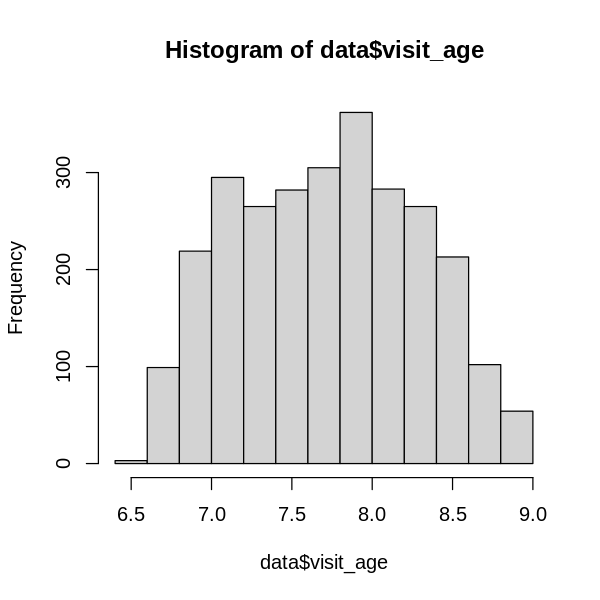

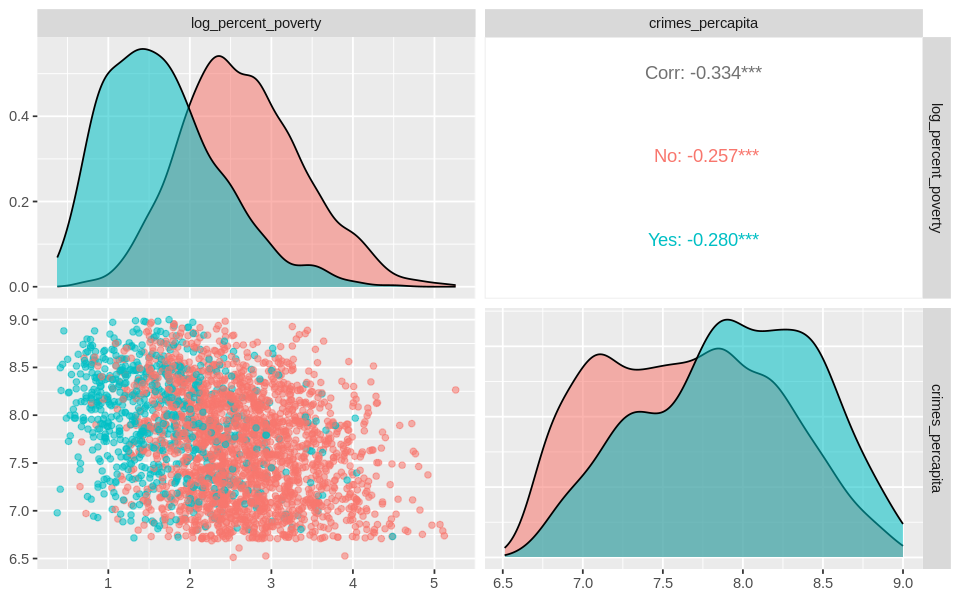

In [ ]:
data$visit_age = data$visit_age^0.5
hist(data$visit_age)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$visit_age)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))



`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


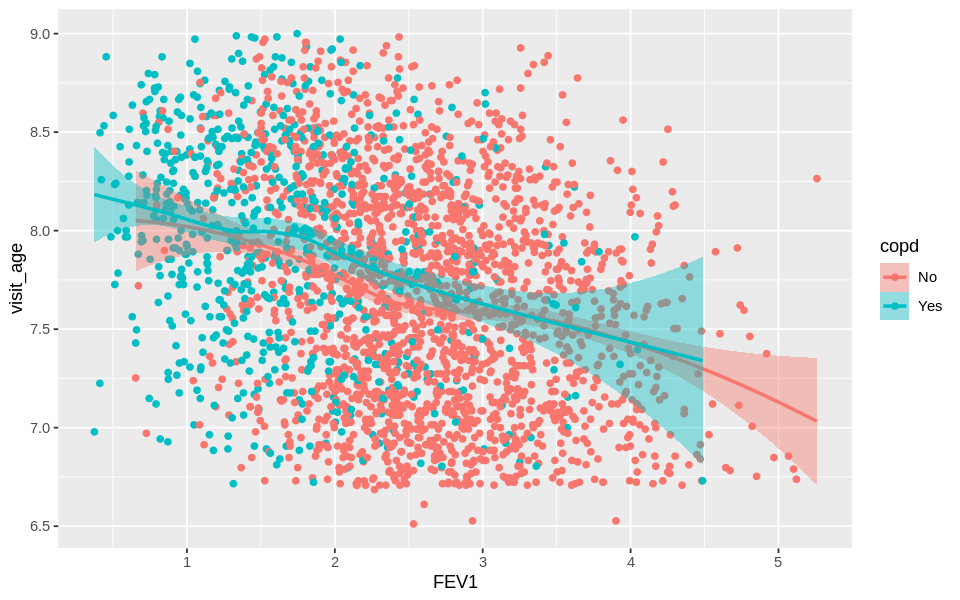

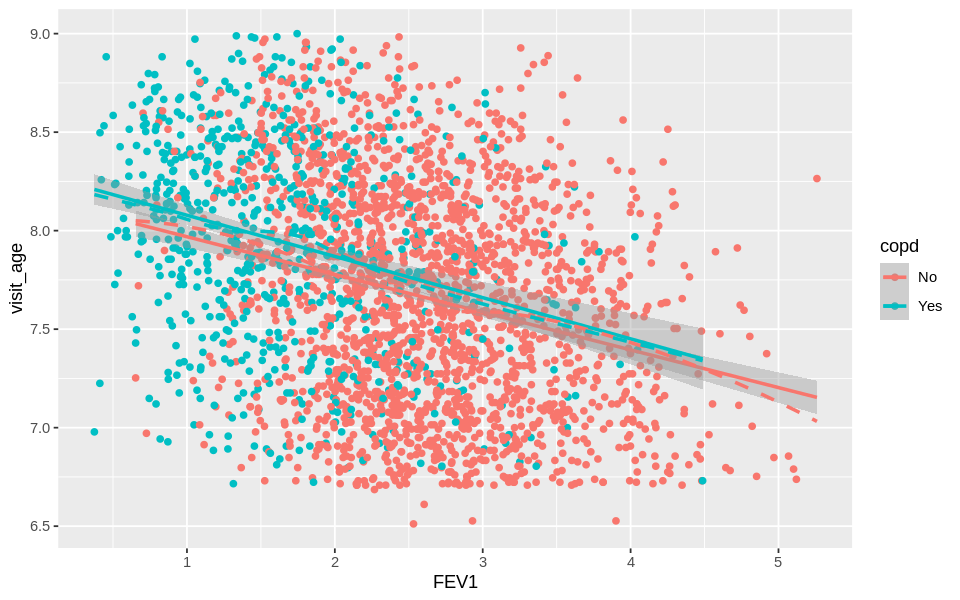

In [ ]:
options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=visit_age, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=visit_age, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

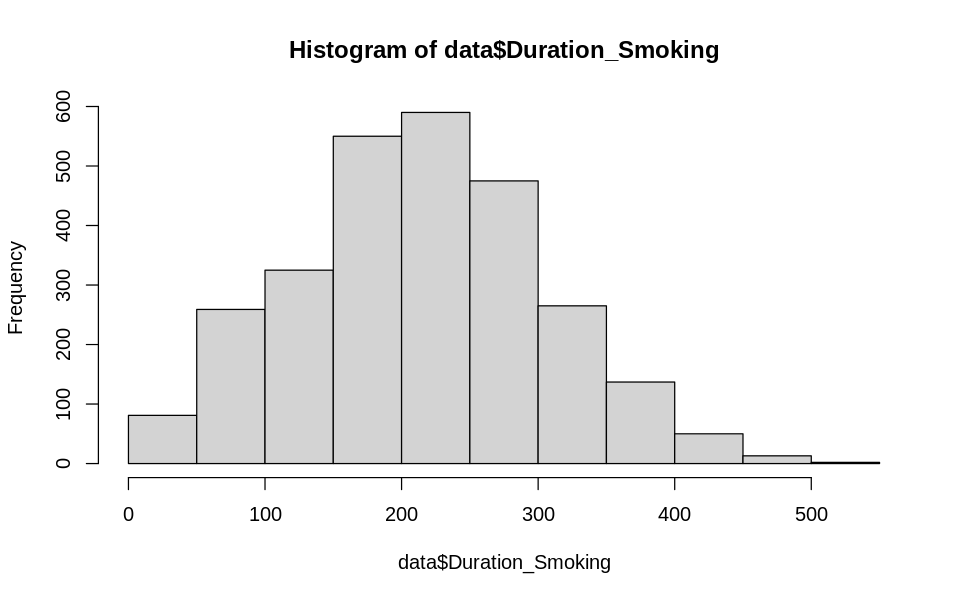

`geom_smooth()` using formula = 'y ~ x'


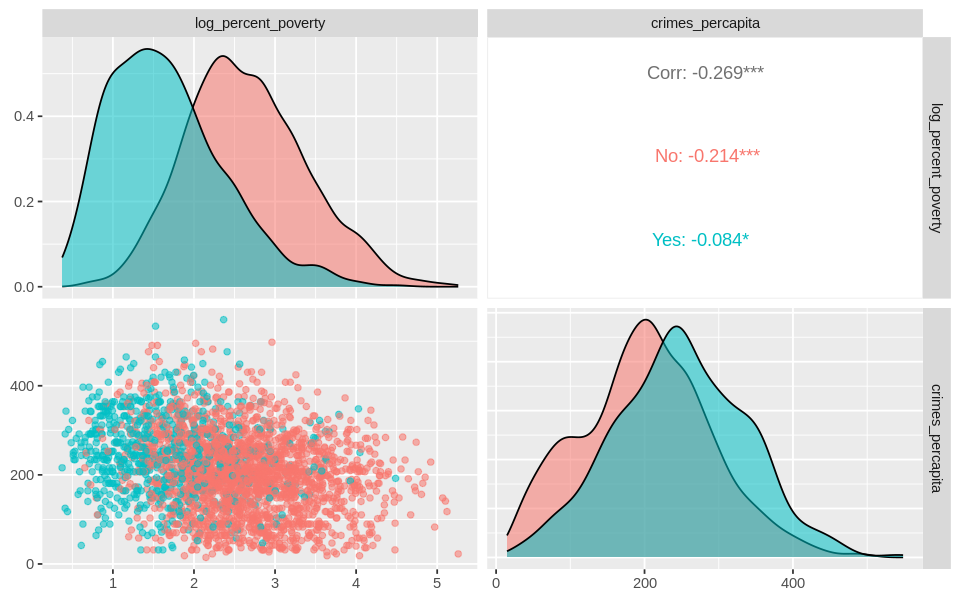

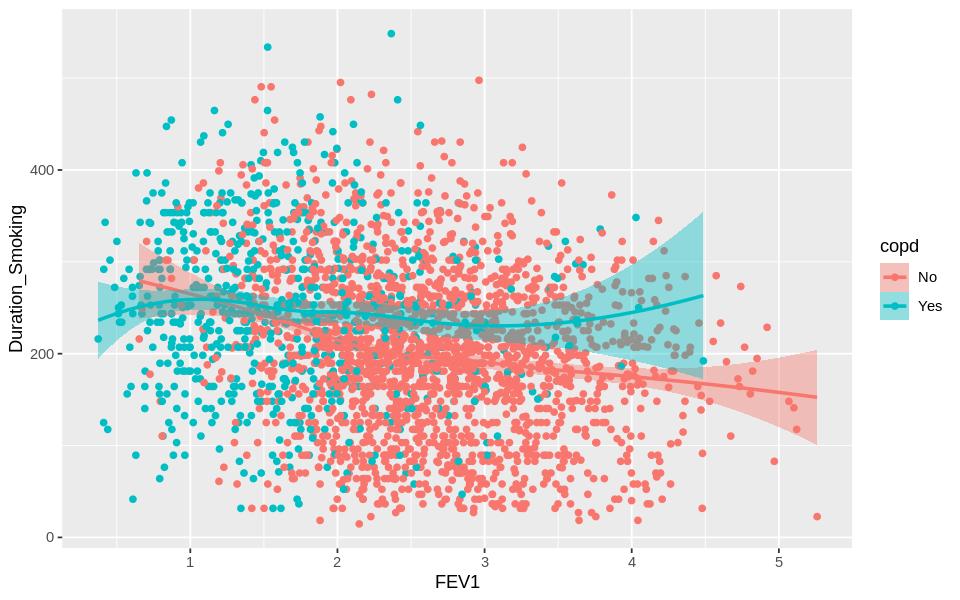

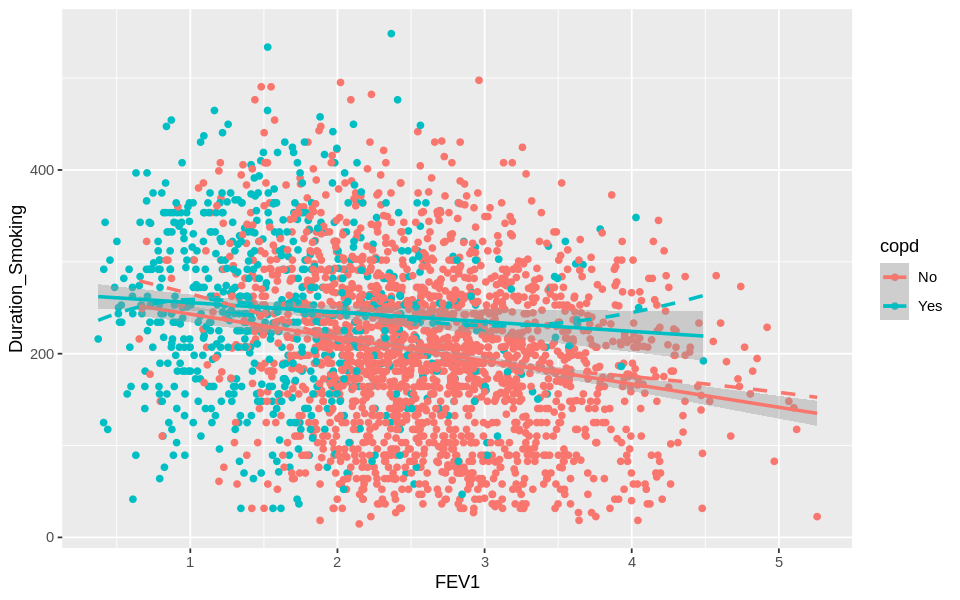

In [ ]:
data$Duration_Smoking = data$Duration_Smoking^1.5
hist(data$Duration_Smoking)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$Duration_Smoking)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=Duration_Smoking, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=Duration_Smoking, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)



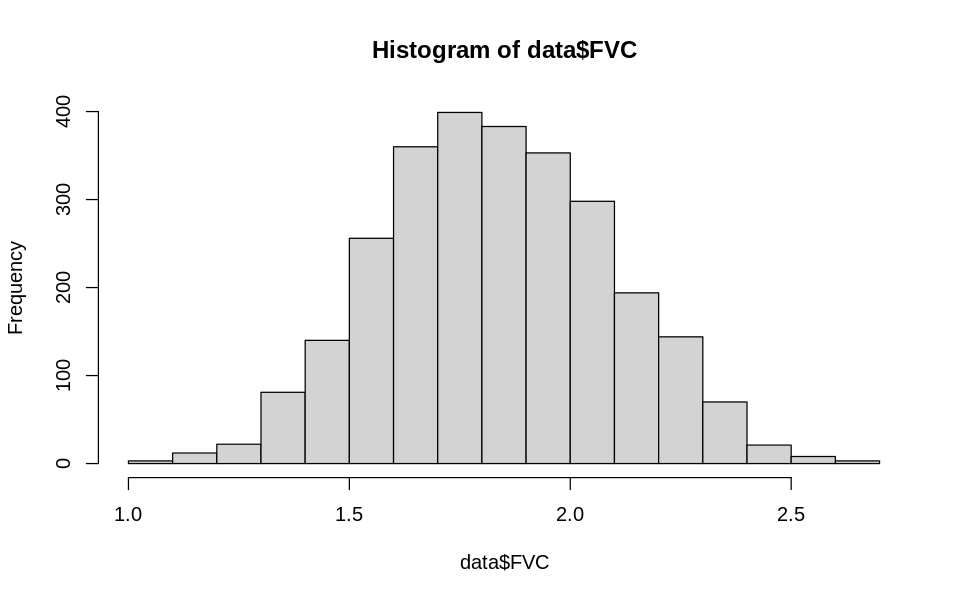

`geom_smooth()` using formula = 'y ~ x'


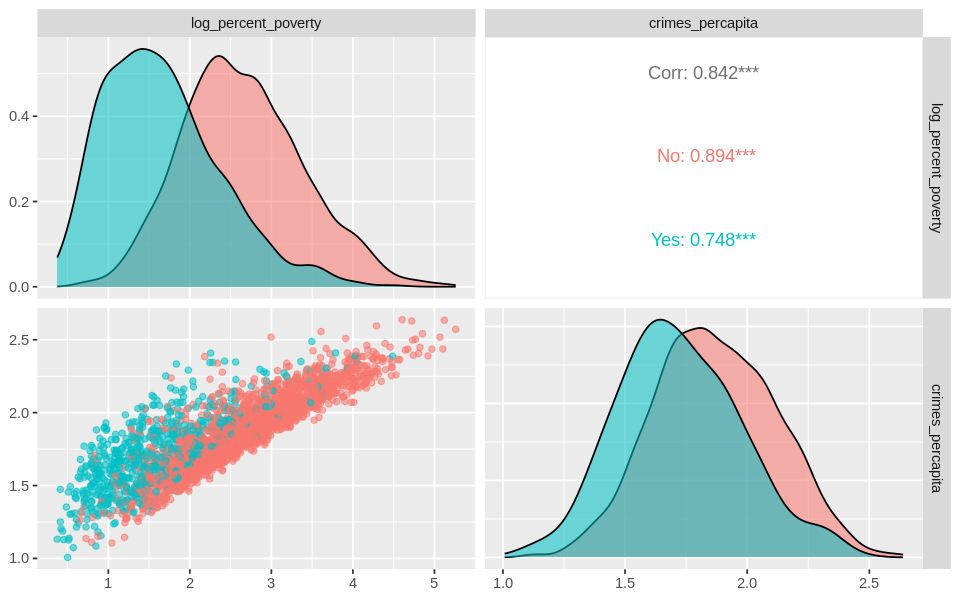

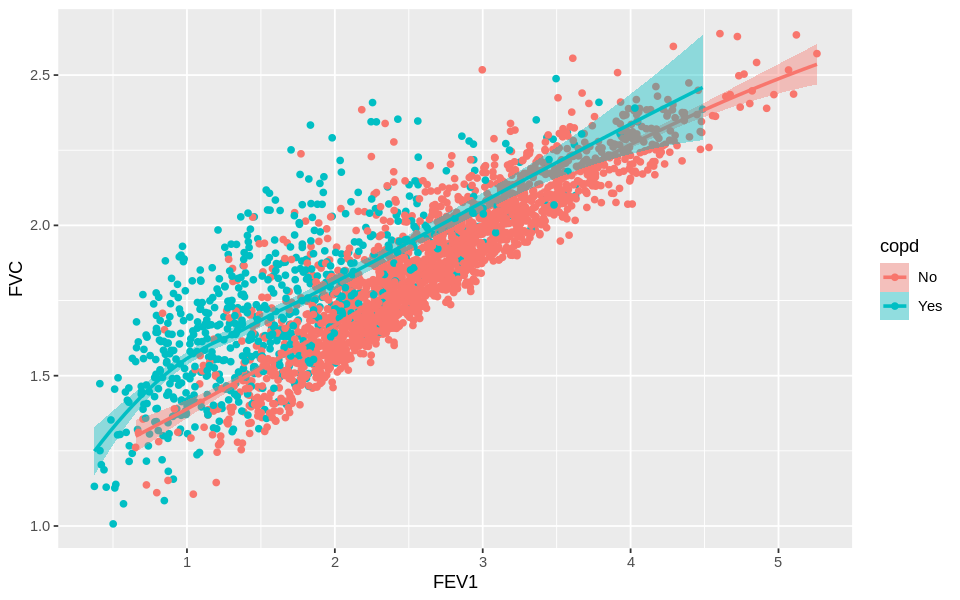

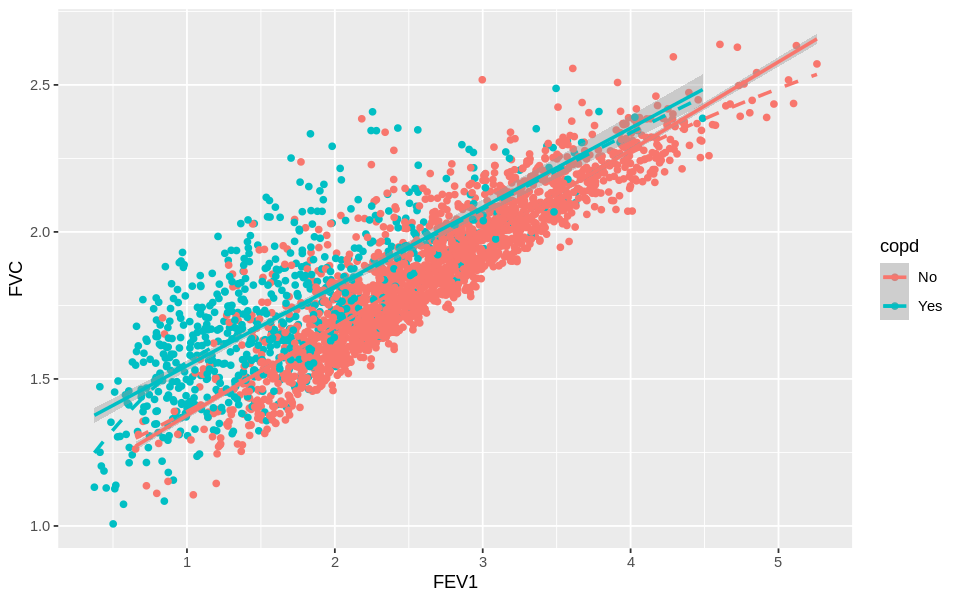

In [ ]:
data$FVC = data$FVC^0.5
hist(data$FVC)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$FVC)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=FVC, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=FVC, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

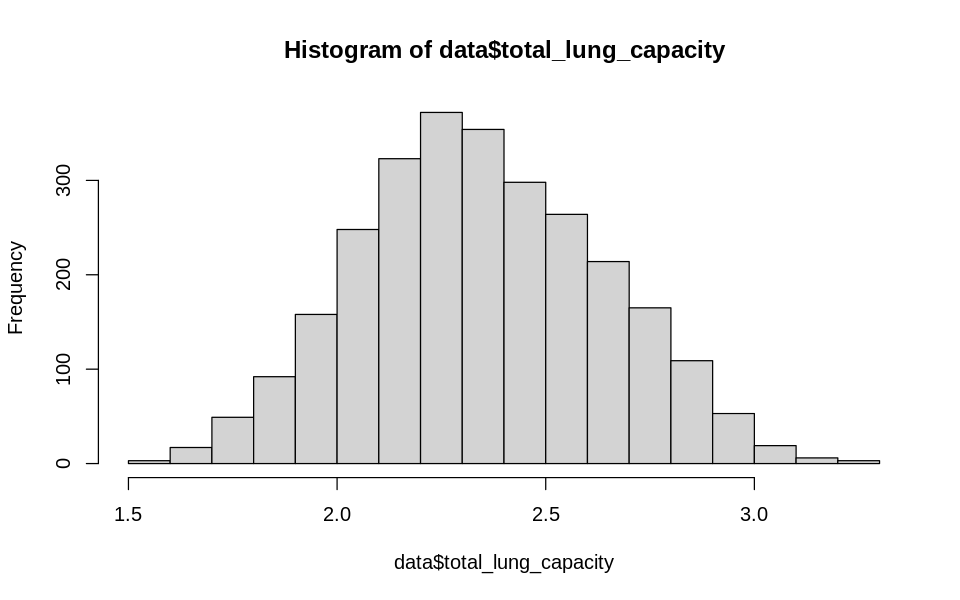

`geom_smooth()` using formula = 'y ~ x'


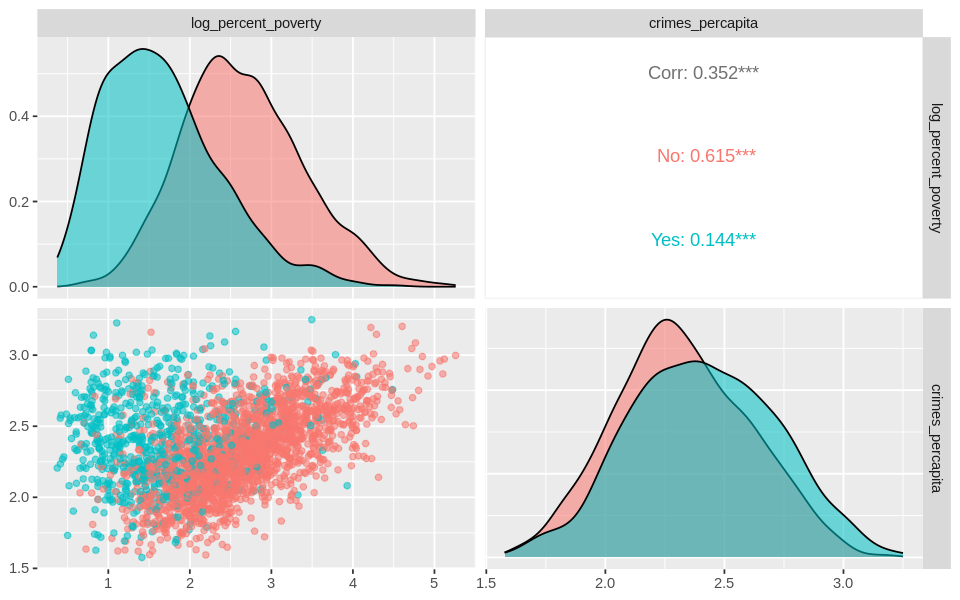

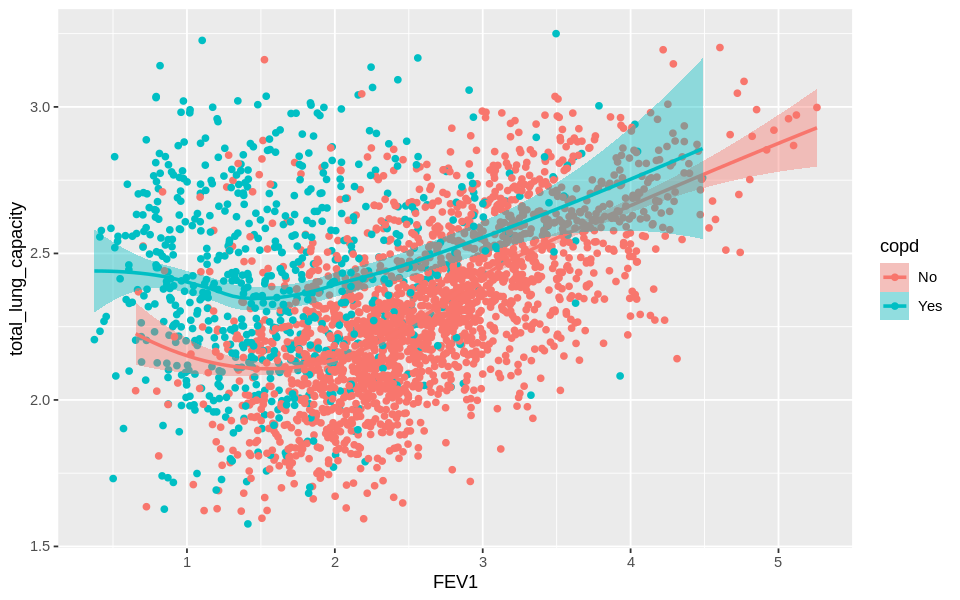

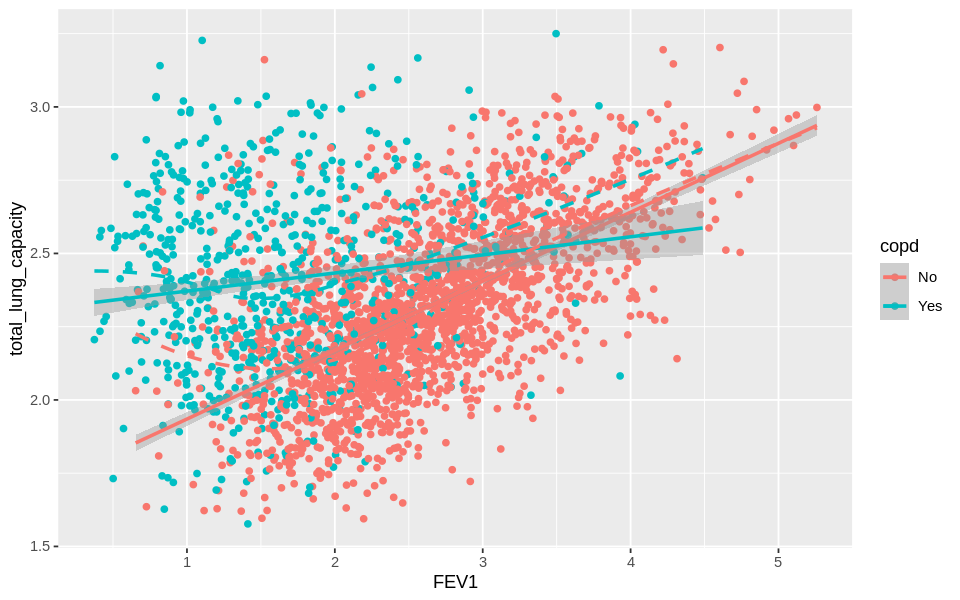

In [ ]:
data$total_lung_capacity = data$total_lung_capacity^0.5
hist(data$total_lung_capacity)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$total_lung_capacity)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=total_lung_capacity, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=total_lung_capacity, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

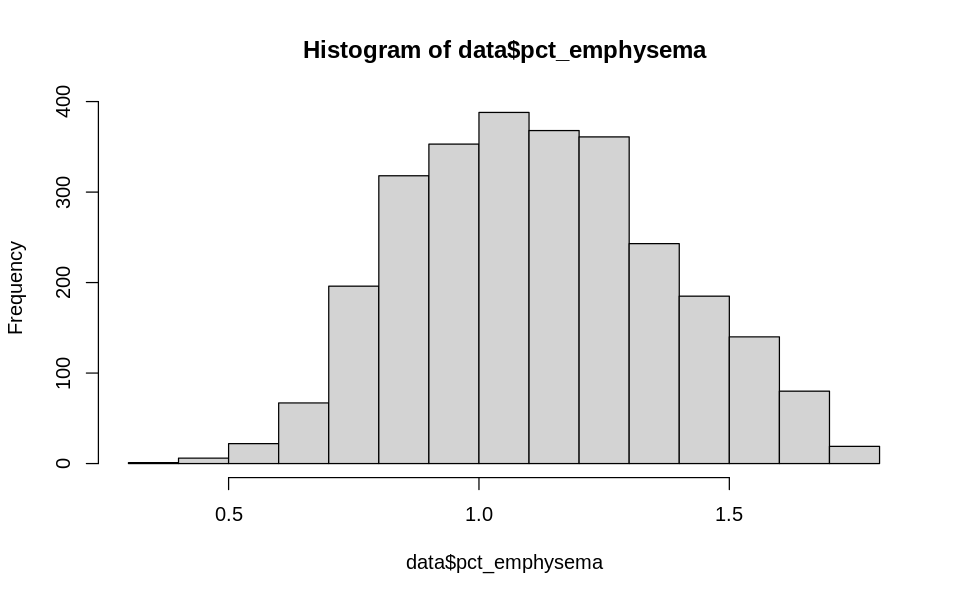

`geom_smooth()` using formula = 'y ~ x'


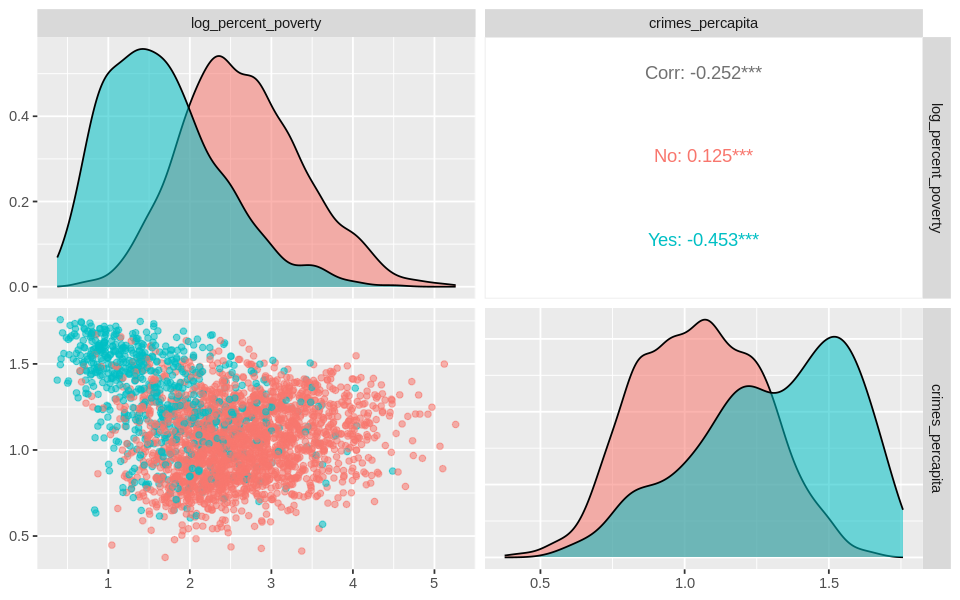

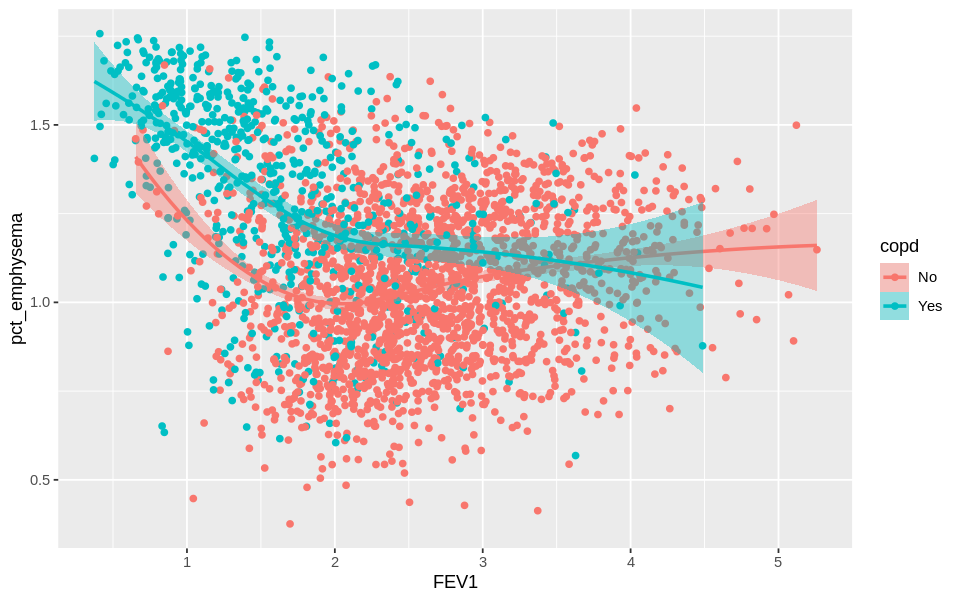

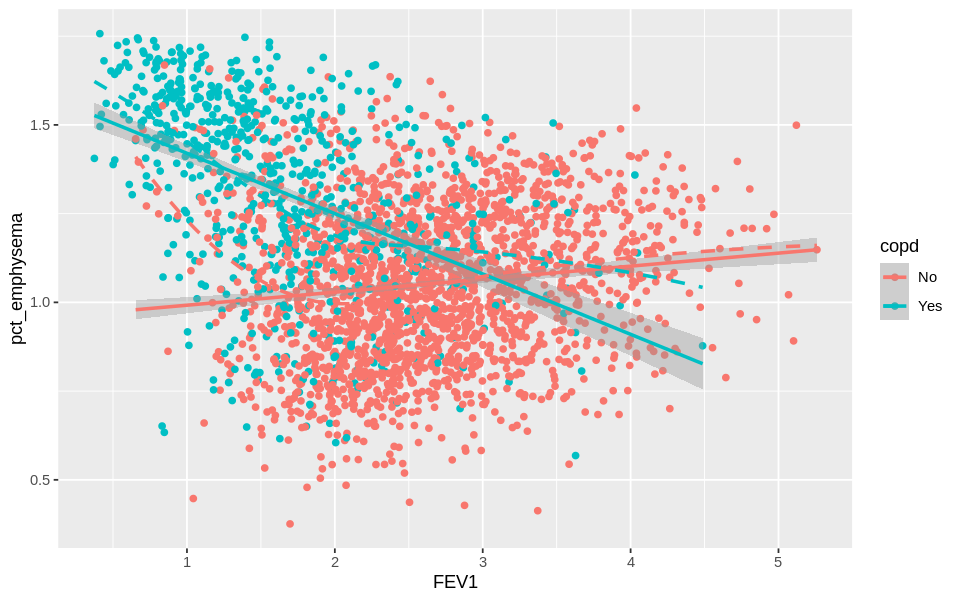

In [ ]:
data$pct_emphysema = data$pct_emphysema^0.14
hist(data$pct_emphysema)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$pct_emphysema)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=pct_emphysema, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=pct_emphysema, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

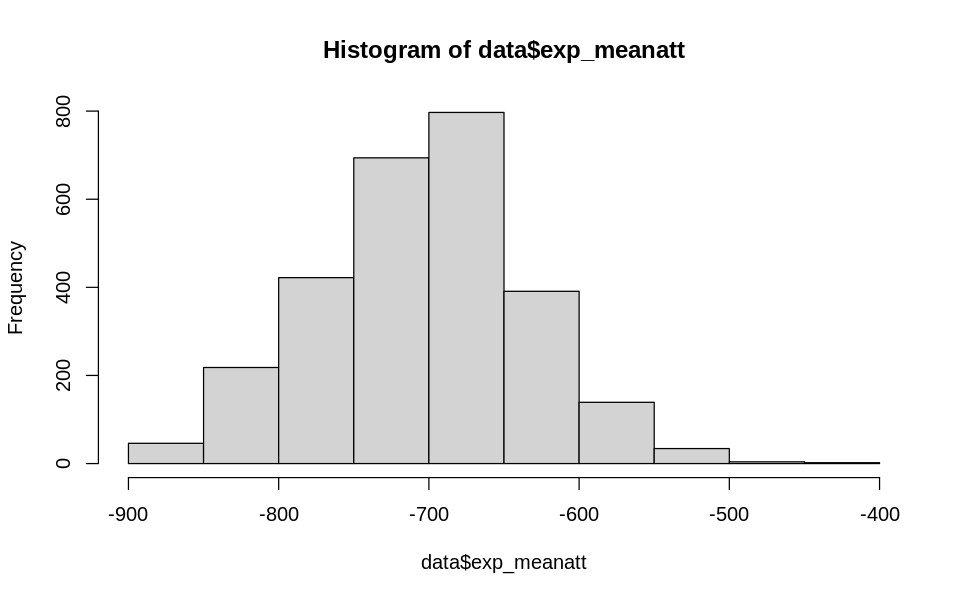

`geom_smooth()` using formula = 'y ~ x'


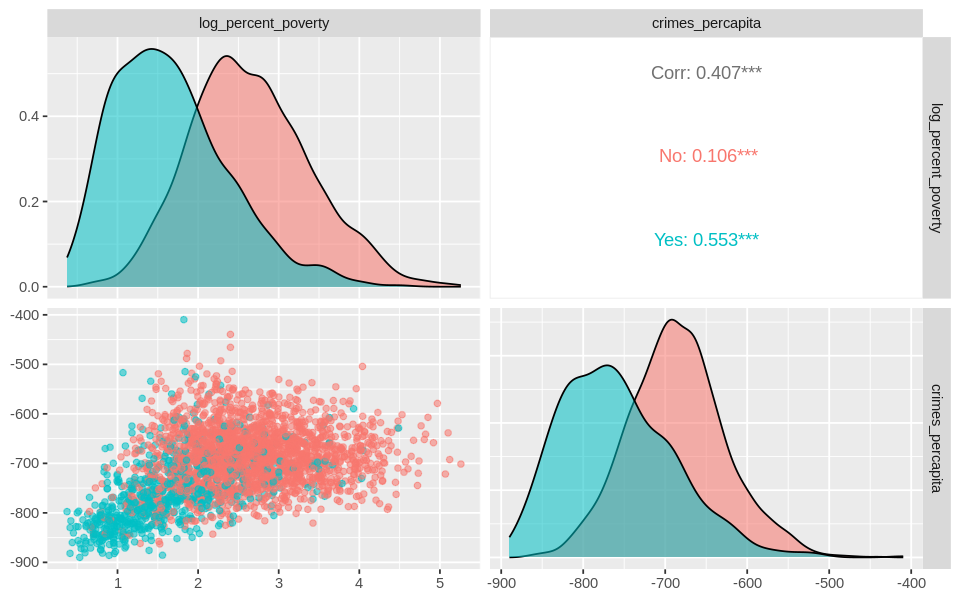

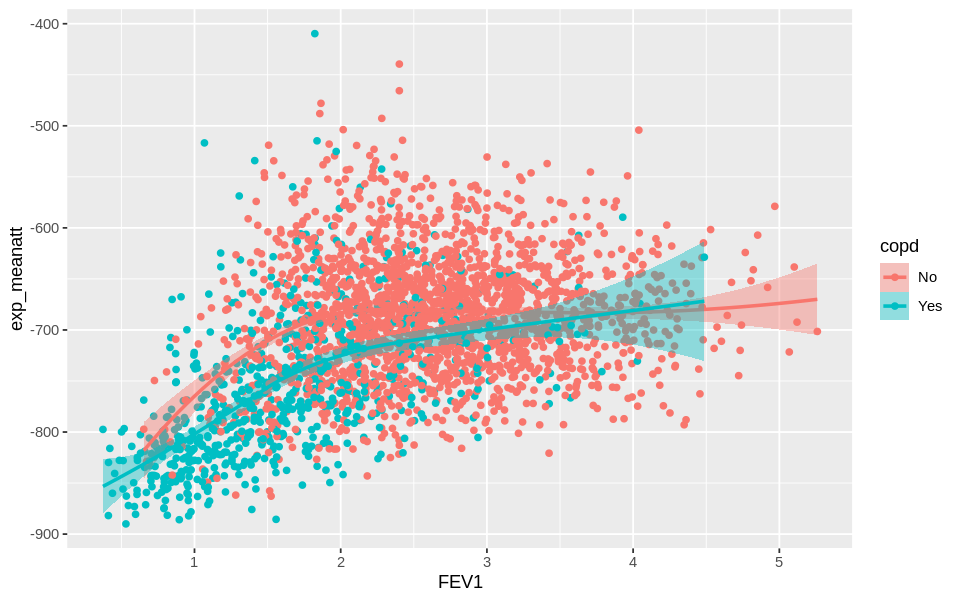

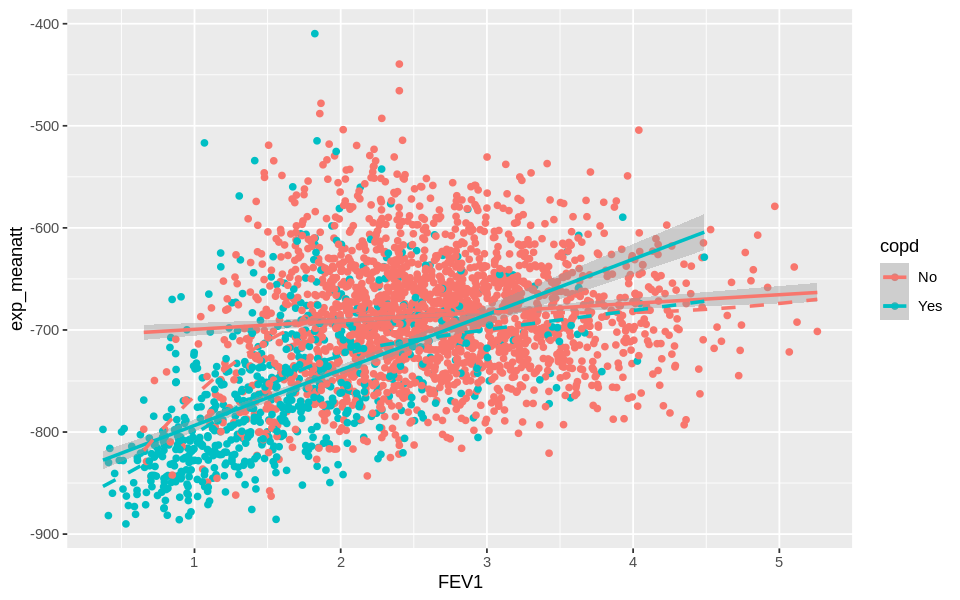

In [ ]:
hist(data$exp_meanatt)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$exp_meanatt)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=exp_meanatt, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=exp_meanatt, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

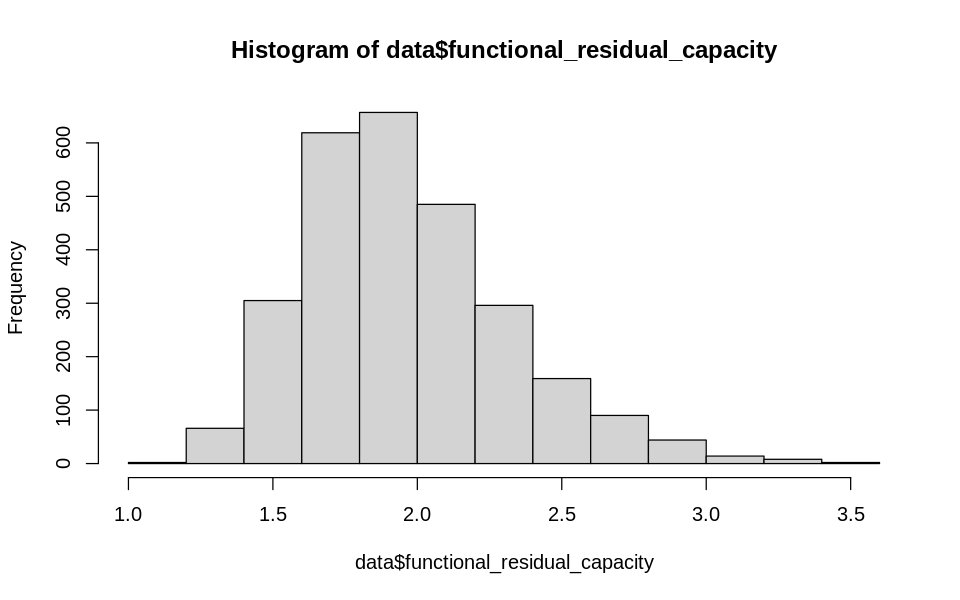

`geom_smooth()` using formula = 'y ~ x'


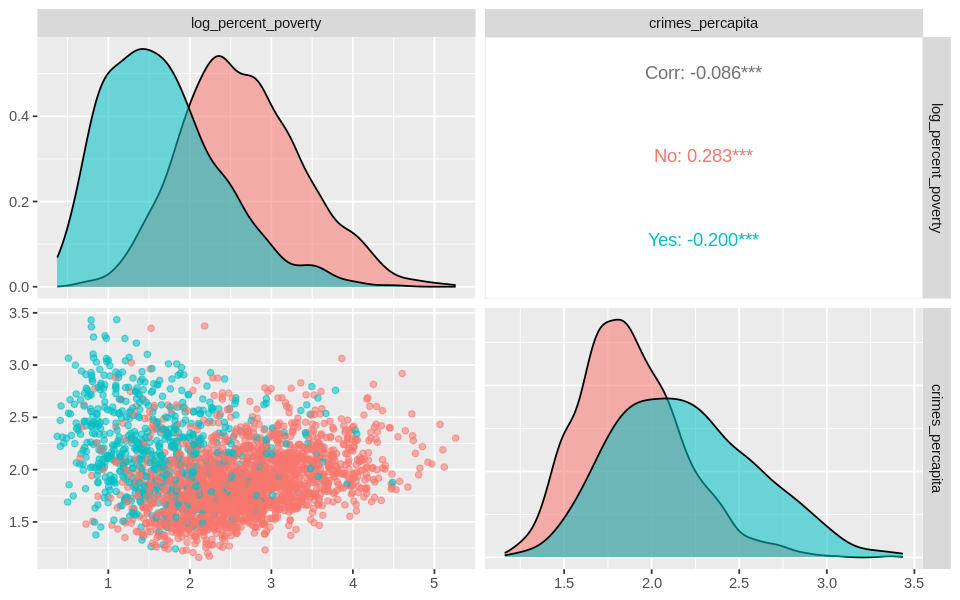

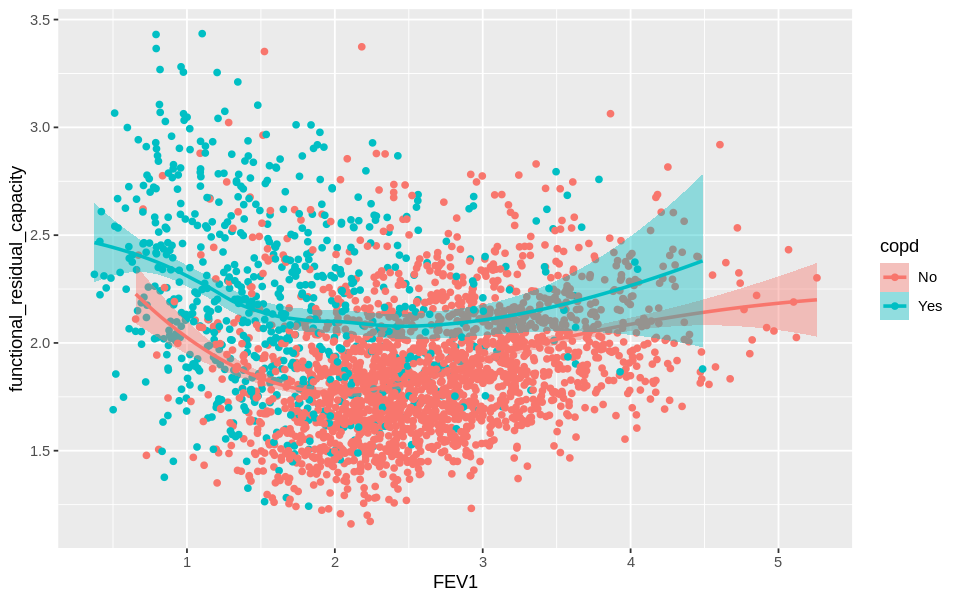

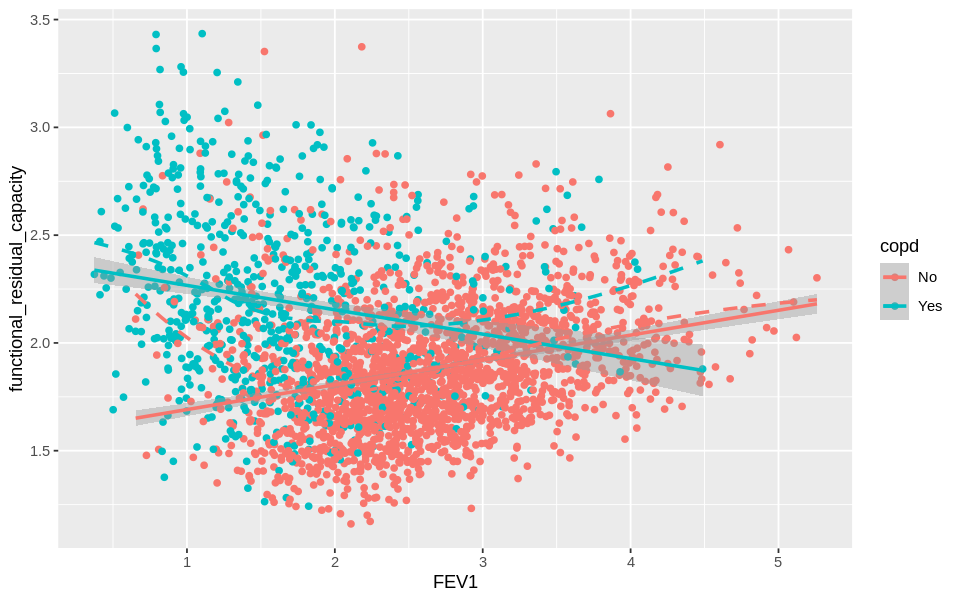

In [ ]:
data$functional_residual_capacity = data$functional_residual_capacity^0.6
hist(data$functional_residual_capacity)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$functional_residual_capacity)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=functional_residual_capacity, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=functional_residual_capacity, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

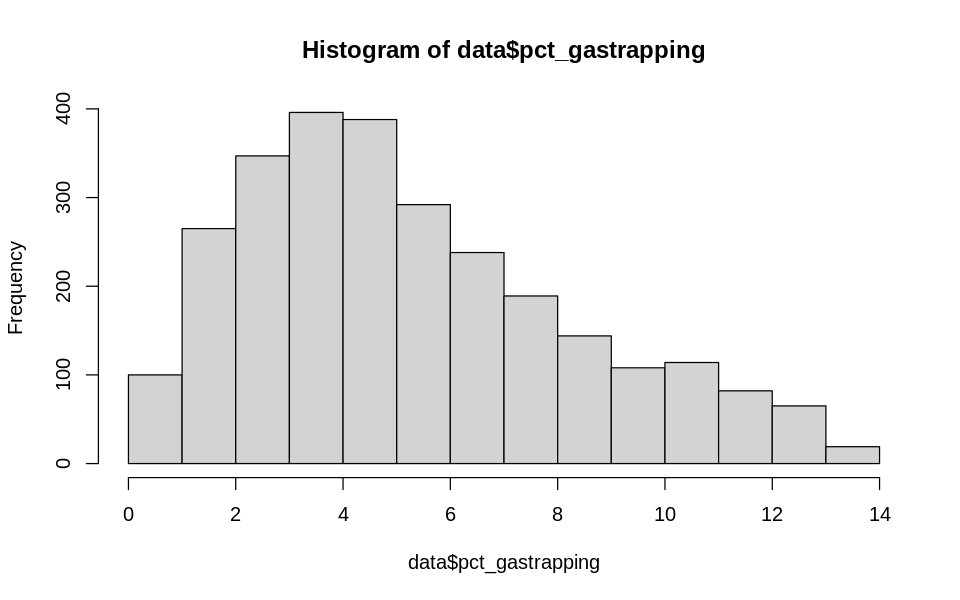

`geom_smooth()` using formula = 'y ~ x'


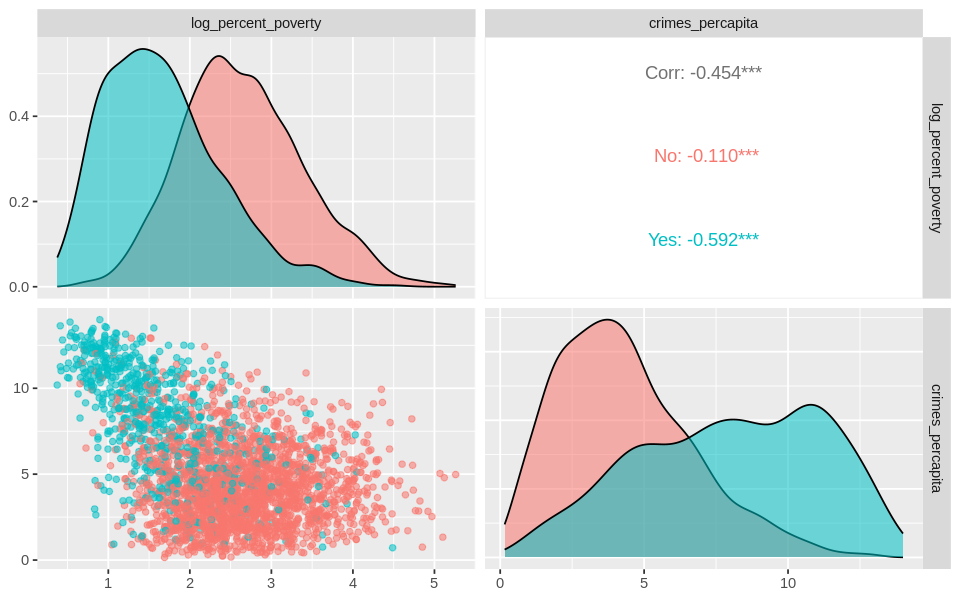

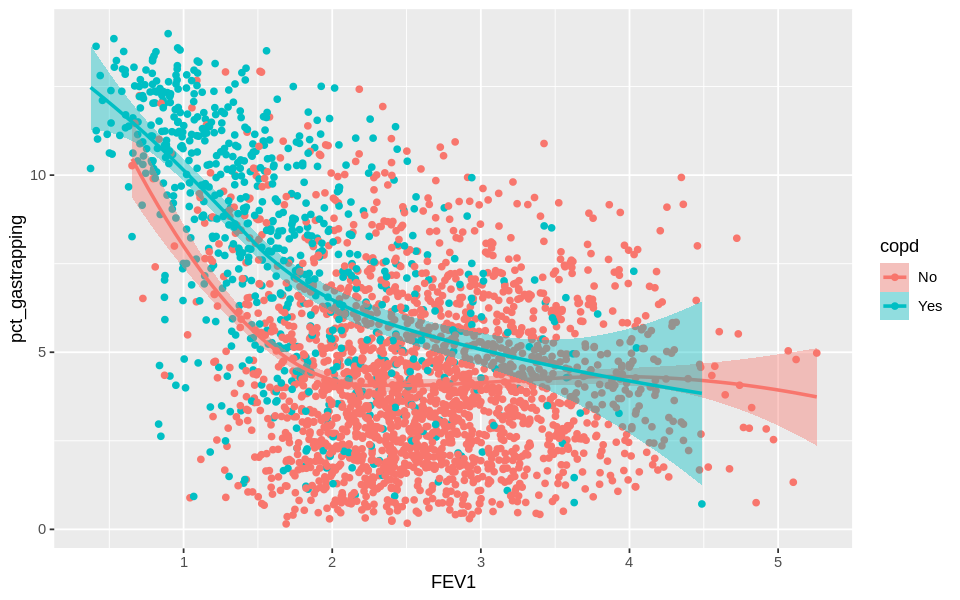

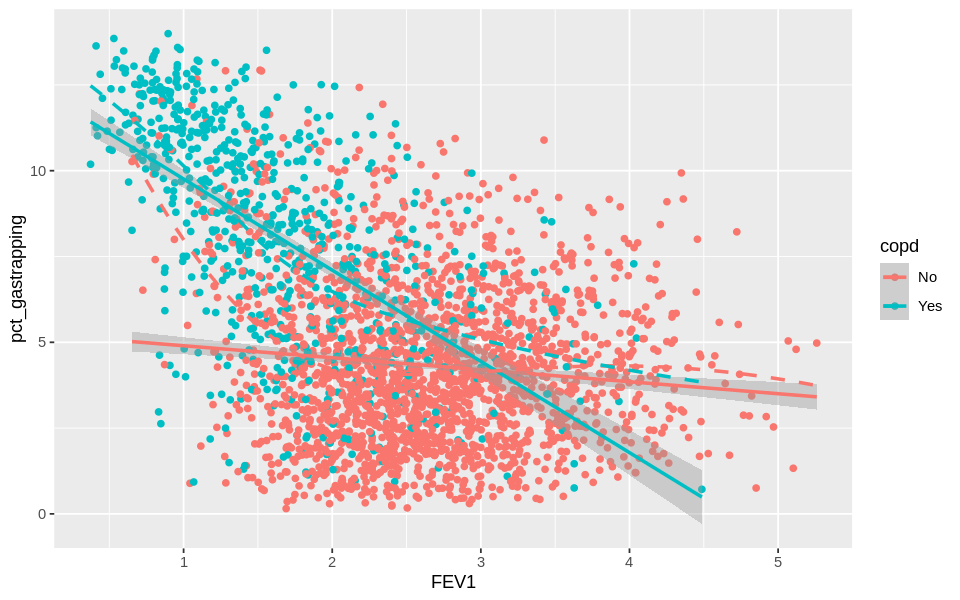

In [ ]:
data$pct_gastrapping = data$pct_gastrapping^0.6
hist(data$pct_gastrapping)
options(repr.plot.width=8, repr.plot.height=5)
plot_frame <- data.frame("log_percent_poverty" = data$FEV1,
                         "crimes_percapita" = data$pct_gastrapping)
ggpairs(plot_frame, aes(color = data$copd , alpha = 0.5))

options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=pct_gastrapping, color=copd)) +
  geom_point() +
  geom_smooth(method=loess, aes(fill=copd))

  options(repr.plot.width=8, repr.plot.height=5)
ggplot(data, aes(x=FEV1, y=pct_gastrapping, color=copd)) +
  geom_point() +
  stat_smooth(method = "lm", formula = y ~ x, size = 1) +
  stat_smooth(method = "loess", formula = y ~ x, size = 1,se=FALSE, lty=2)

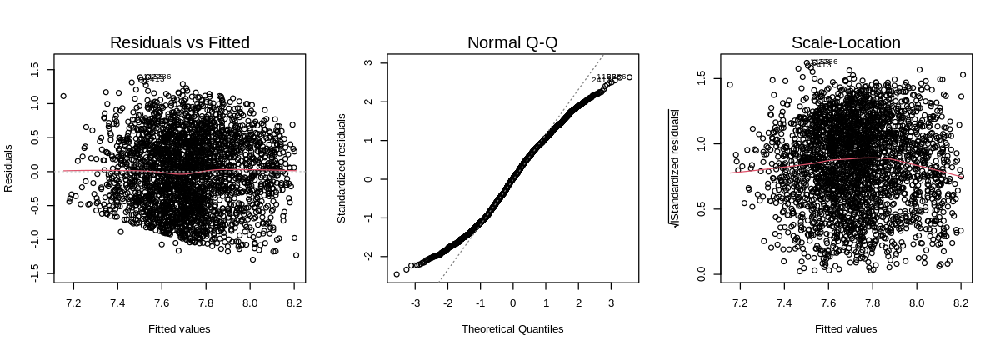

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit1 <- lm(visit_age~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit1, which=c(1,2,3))



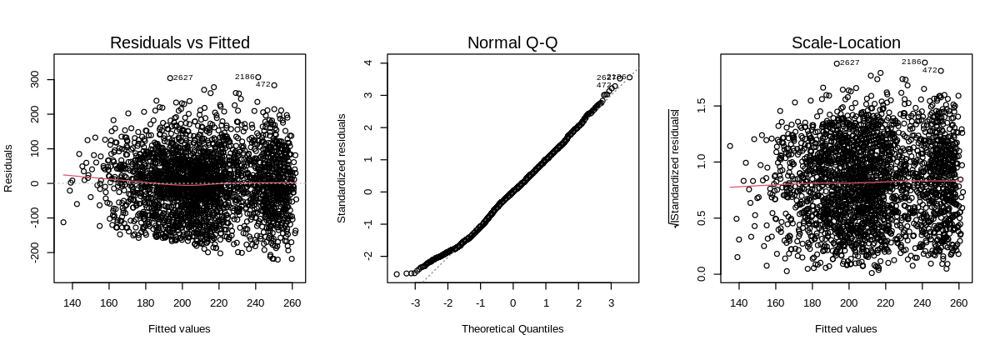

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit2 <- lm(Duration_Smoking~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit2, which=c(1,2,3))



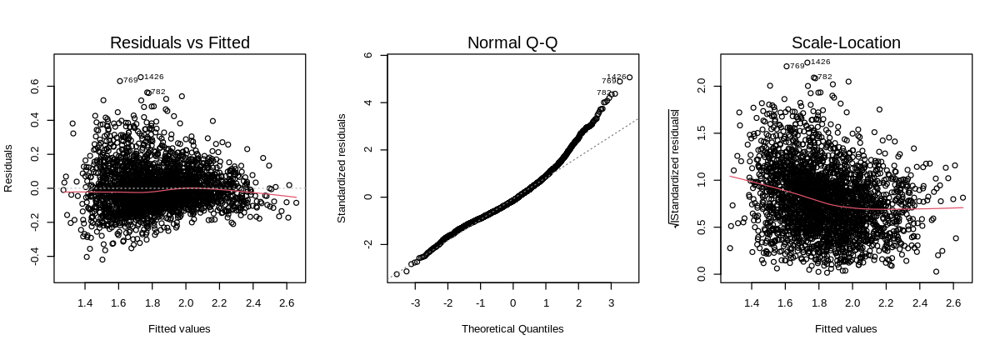

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit3 <- lm(FVC~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit3, which=c(1,2,3))



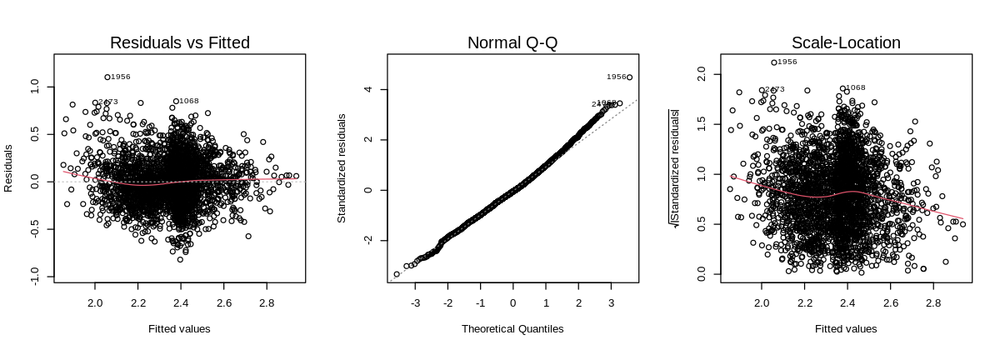

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit4 <- lm(total_lung_capacity~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit4, which=c(1,2,3))



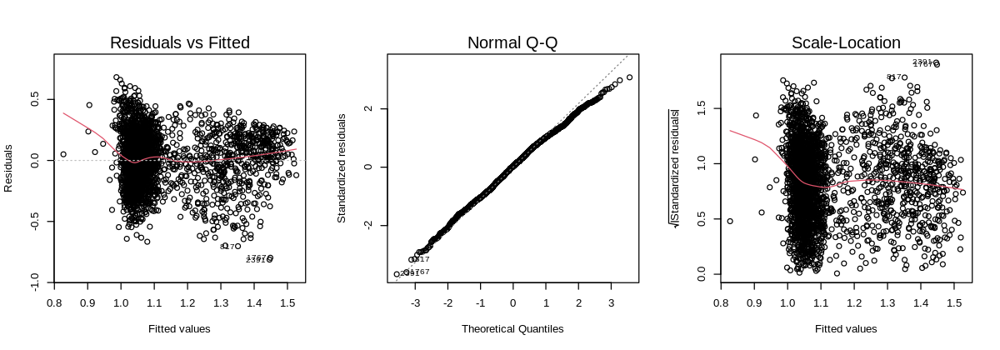

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit5 <- lm(pct_emphysema~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit5, which=c(1,2,3))



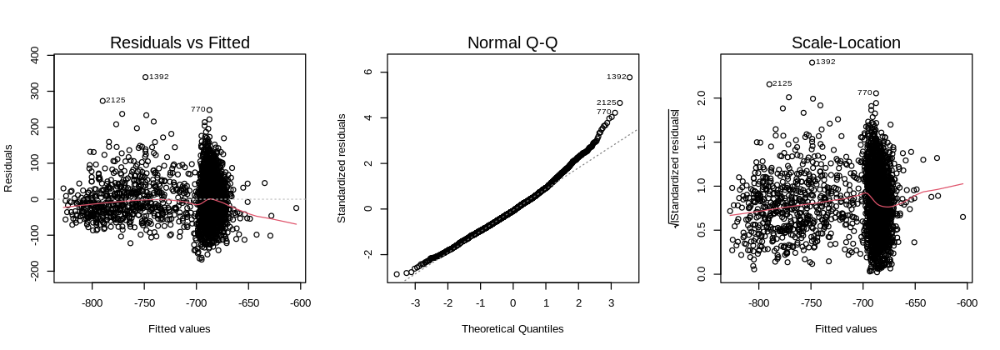

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit6 <- lm(exp_meanatt~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit6, which=c(1,2,3))



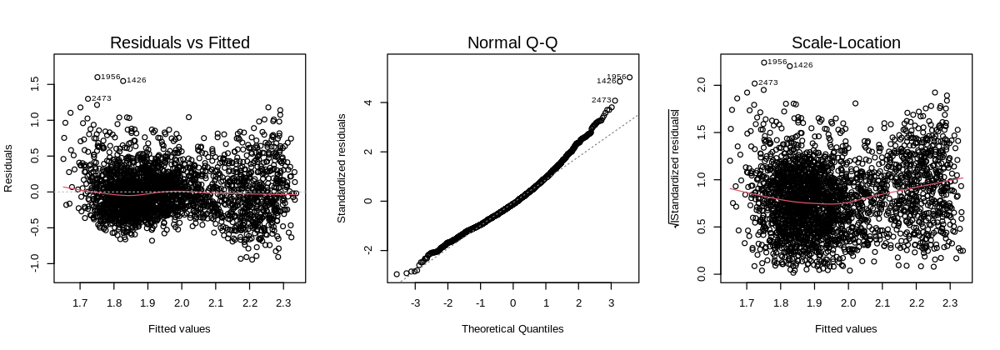

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit7 <- lm(functional_residual_capacity~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit7, which=c(1,2,3))

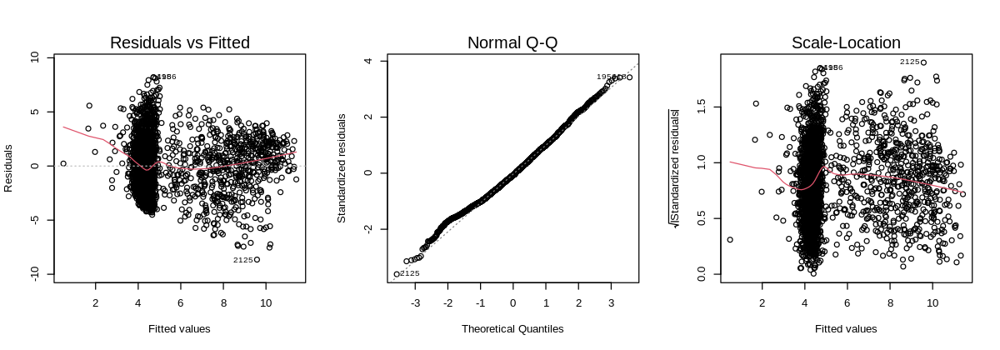

In [ ]:
options(repr.plot.width=10, repr.plot.height=3.5)
par(mfrow=c(1,3))
fit8 <- lm(pct_gastrapping~
           FEV1+
          copd +
          FEV1:copd,
          data = data)
plot(fit8, which=c(1,2,3))

In [ ]:
BIC(fit1)
BIC(fit2)
BIC(fit3)
BIC(fit4)
BIC(fit5)
BIC(fit6)
BIC(fit7)
BIC(fit8)

[1] 4323.117

[1] 32327.39

[1] -3423.25

[1] 128.9836

[1] -439.4828

[1] 30210.65

[1] 1555.815

[1] 12647.3

In [ ]:
preds <- with(data, cbind(visit_age, Duration_Smoking, FVC, total_lung_capacity, pct_emphysema,
                        pct_gastrapping,exp_meanatt, functional_residual_capacity))


In [ ]:
library(leaps)
best_subset <- regsubsets(preds, y = data$FEV1 ,
nbest = 30, # save the best # for each
nvmax = 20, # maximum number of variables allowed
really.big = T)

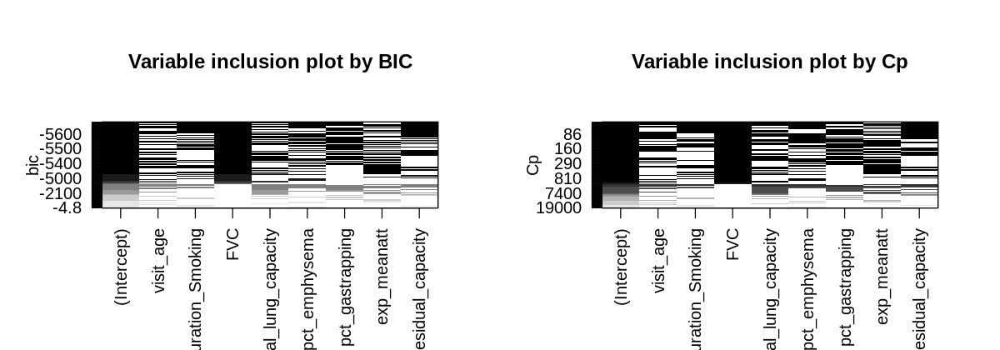

In [ ]:
par(mfrow = c(1, 2))
plot(best_subset, scale = "bic", main = "Variable inclusion plot by BIC")
plot(best_subset, scale = "Cp", main = "Variable inclusion plot by Cp")
par(mfrow = c(1, 1))

In [ ]:
par(mfrow=c(1, 3))

plot_best <- function(number_variables, crit, func) {

    # plot criteria vs number of variables
    plot(number_variables, model_summ[[crit]],
         xlab = "number of variables", ylab = crit,
         cex.lab = 2)

    # plot line for visualization
    lines(unique(number_variables), tapply(model_summ[[crit]], number_variables, match.fun(func)))

}

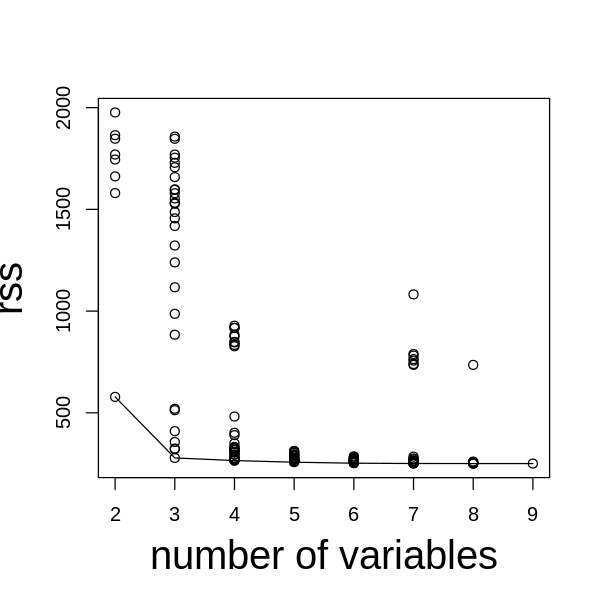

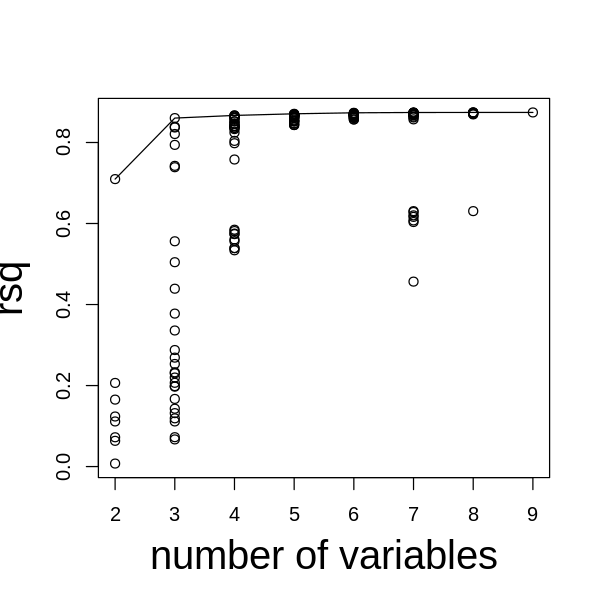

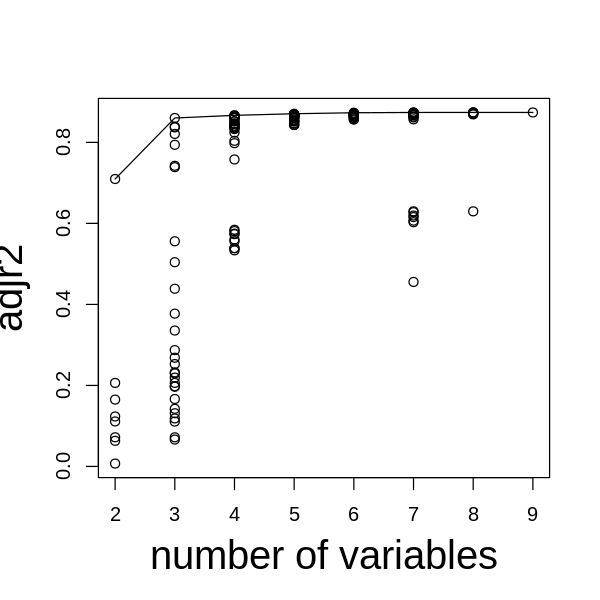

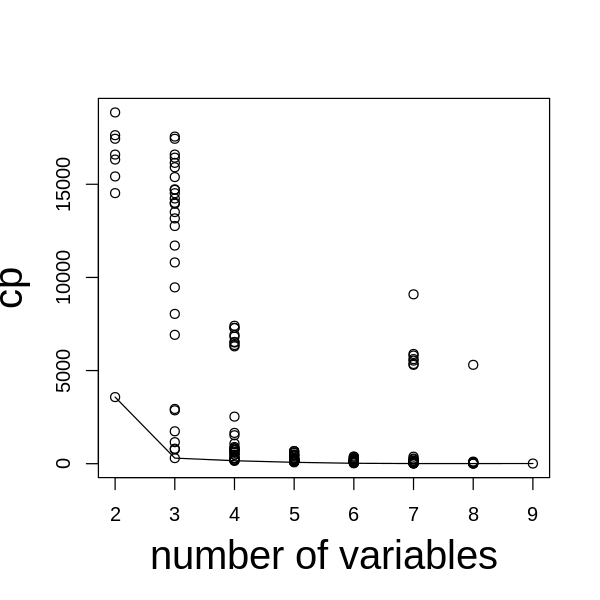

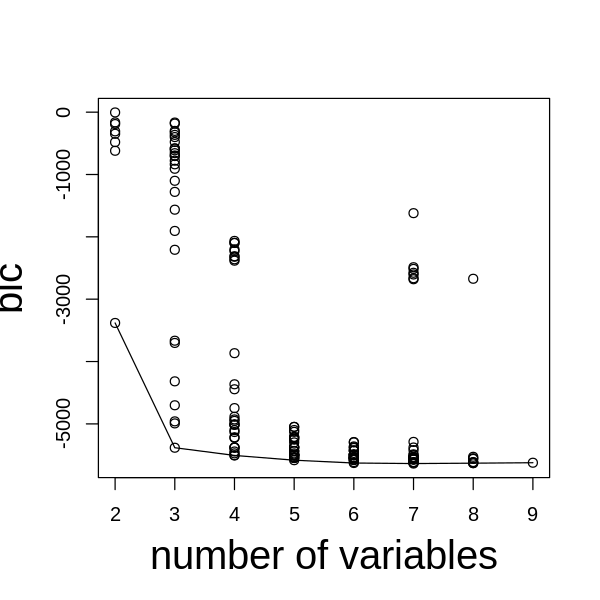

In [ ]:
model_summ <- summary(best_subset)  # store the summary of the best subsets
options(repr.plot.width=5, repr.plot.height=5)
# plot criteria vs number of variables
number_variables <- apply(model_summ$which, 1, sum)
plot_best(number_variables, 'rss', 'min')
plot_best(number_variables, 'rsq', 'max')
plot_best(number_variables, 'adjr2', 'max')
plot_best(number_variables, 'cp', 'min')
plot_best(number_variables, 'bic', 'min')

In [ ]:
criteria <- data.frame(p = number_variables,
                       rss = model_summ$rss,
                       rsq = model_summ$rsq,
                       adjr2 = model_summ$adjr2,
                       cp = model_summ$cp,
                       bic = model_summ$bic)


# shows all criteria and included variables ordered by bic
criteria <- cbind(criteria, model_summ$outmat)
print(head(criteria[order(criteria$bic),]))

         p      rss       rsq     adjr2        cp       bic visit_age
6  ( 1 ) 7 250.7633 0.8740686 0.8737929  7.438674 -5636.406          
7  ( 1 ) 8 250.5860 0.8741577 0.8738361  7.501434 -5630.431         *
7  ( 2 ) 8 250.7073 0.8740968 0.8737750  8.826333 -5629.102          
5  ( 1 ) 6 252.2772 0.8733084 0.8730773 21.983480 -5627.790          
8  ( 1 ) 9 250.5401 0.8741807 0.8738131  9.000000 -5623.016         *
6  ( 2 ) 7 252.1615 0.8733665 0.8730892 22.719210 -5621.132          
         Duration_Smoking FVC total_lung_capacity pct_emphysema pct_gastrapping
6  ( 1 )                *   *                   *             *               *
7  ( 1 )                *   *                   *             *               *
7  ( 2 )                *   *                   *             *               *
5  ( 1 )                *   *                                 *               *
8  ( 1 )                *   *                   *             *               *
6  ( 2 )                *   * 


Call:
lm(formula = data$FEV1 ~ data$total_lung_capacity + data$Duration_Smoking + 
    data$functional_residual_capacity)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.85828 -0.41613 -0.03748  0.35437  2.59106 

Coefficients:
                                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)                       -0.2939581  0.0999525  -2.941   0.0033 ** 
data$total_lung_capacity           2.8977713  0.0649466  44.618   <2e-16 ***
data$Duration_Smoking             -0.0015204  0.0001388 -10.955   <2e-16 ***
data$functional_residual_capacity -1.9300099  0.0548291 -35.200   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.6246 on 2743 degrees of freedom
Multiple R-squared:  0.4626,	Adjusted R-squared:  0.462 
F-statistic:   787 on 3 and 2743 DF,  p-value: < 2.2e-16


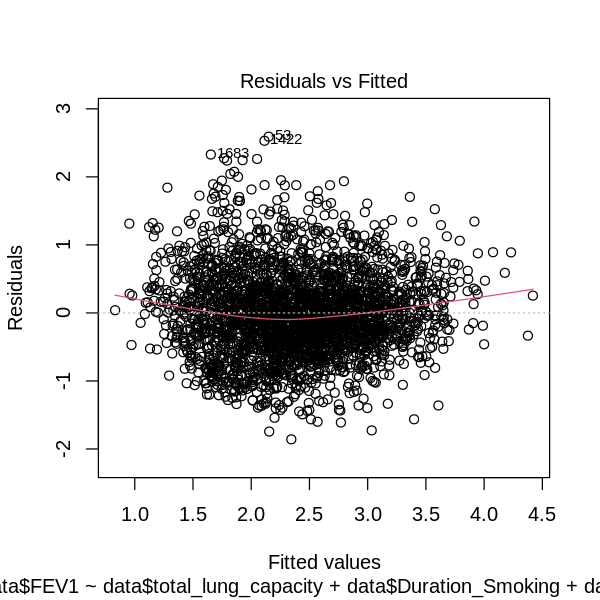

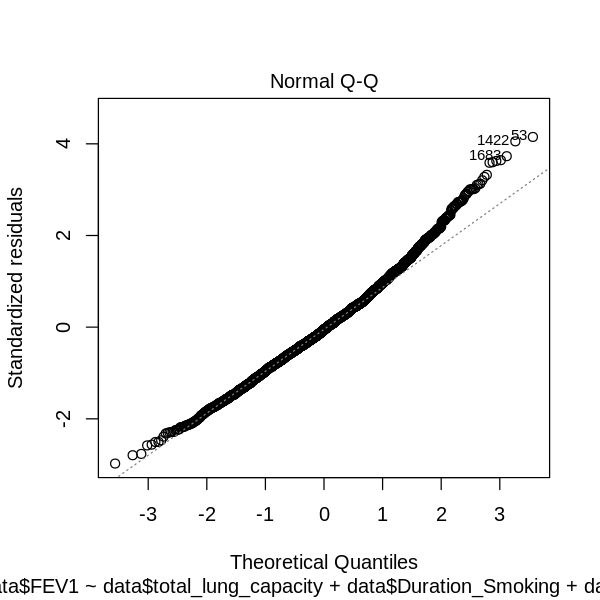

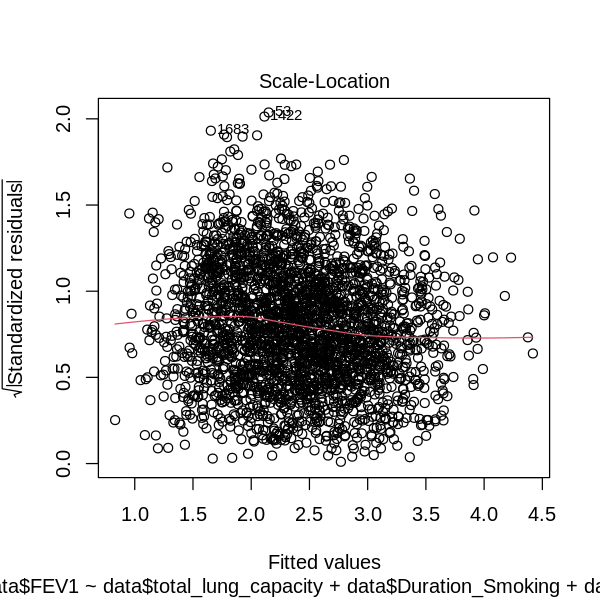

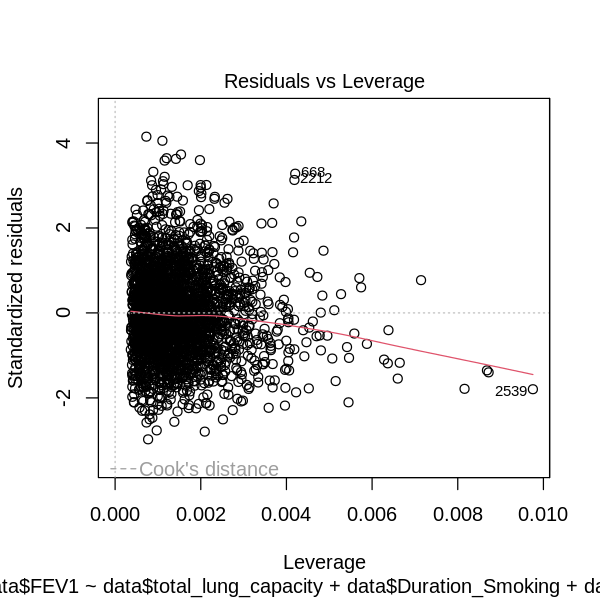

In [ ]:
model <- lm(data$FEV1~data$total_lung_capacity+data$Duration_Smoking+data$functional_residual_capacity)
summary(model)
plot(model)